# **Text Classification with Scikit Learn**

Text classification, a fundamental natural language processing (NLP) technique, involves categorizing text documents into predefined classes or categories based on their content. In this process, machine learning algorithms learn patterns and features from labeled text data to make predictions on new, unlabeled text.

This notebook leverages text classification techniques using the Scikit-Learn library to classify text based on sentiment or tone. It introduces a dataset and showcases the use of machine learning tools to automatically categorize text into different sentiment categories, providing insights into the emotions or attitudes conveyed within the text.

## Setup

Here, we're importing the necessary libraries. For our text classification task, we'll rely on [scikit-learn](https://scikit-learn.org), employing the Naive Bayes Classifier. Scikit-learn offers various feature extraction techniques, including count-based and tf-idf methods. Additionally, we'll utilize NLTK for text preprocessing.

In [1]:
from sklearn.datasets import load_files
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.pipeline import Pipeline
from sklearn.naive_bayes import MultinomialNB
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.datasets import fetch_20newsgroups

import matplotlib.pyplot as plt
from wordcloud import WordCloud

import re

import nltk
from nltk import word_tokenize
from nltk.tokenize import wordpunct_tokenize
from nltk.tokenize import RegexpTokenizer
from nltk.stem import WordNetLemmatizer
from nltk.stem import SnowballStemmer
from nltk.stem import PorterStemmer
from nltk.corpus import wordnet

# The following added to the Lab9 code.
from nltk.corpus import movie_reviews

from sklearn.feature_selection import SelectKBest, mutual_info_classif
from sklearn.feature_selection import chi2
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer
from sklearn.metrics import accuracy_score
import numpy as np #note last week's lab used 'import numpy'
import pandas as pd
import random

import warnings
warnings.filterwarnings('ignore')

Execute this to ensure you have the stopword list and other preprocessing data available. This cell will also download a pre-packaged NLTK dataset, specifically a collection of movie reviews, which will be further explained below.

In [2]:
nltk.download('stopwords')
nltk.download('averaged_perceptron_tagger')
nltk.download('wordnet')
nltk.download('punkt')
nltk.download('movie_reviews')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package movie_reviews to /root/nltk_data...
[nltk_data]   Unzipping corpora/movie_reviews.zip.


True

In [3]:
stop_words = None
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS as sklearn_stop_words
nltk_stop_words = nltk.corpus.stopwords.words('english')

We then defined some helper functions

In [4]:
# Function for generating a document preview
def get_preview(docs, targets, target_names, doc_id, max_len=0):
    preview = ''
    if max_len < 1:
        preview += 'Label\n'
        preview += '=====\n'
    else:
        preview += str(doc_id)
        preview += '\t'

    target_label = targets[doc_id]  # Get the target label
    target_index = target_names.index(target_label)  # Find the index of the label

    preview += target_names[target_index]  # Use the index to access the label

    if max_len < 1:
        preview += '\n\nFull Text\n'
        preview += '=========\n'
        preview += docs[doc_id]
        preview += '\n'
    else:
        excerpt = get_excerpt(docs[doc_id], max_len)
        preview += '\t' + excerpt
    return preview

# Regular expression for combining whitespace
_RE_COMBINE_WHITESPACE = re.compile(r"\s+")

# Function to generate an excerpt
def get_excerpt(text, max_len):
    excerpt = _RE_COMBINE_WHITESPACE.sub(' ',text[0:max_len])
    if max_len < len(text):
        excerpt += '...'
    return excerpt.strip()

# Function to combine a defined stop word list (or no stop word list) with any extra stop words defined
def set_stop_words(stop_word_list, extra_stop_words):
    if len(extra_stop_words) > 0:
        if stop_word_list is None:
            stop_word_list = []
        stop_words = list(stop_word_list) + extra_stop_words
    else:
        stop_words = stop_word_list

    return stop_words

# Function to initiate stemming or lemmatization
def set_normaliser(normalise):
    if normalise == 'PorterStemmer':
        normaliser = PorterStemmer()
    elif normalise == 'SnowballStemmer':
        normaliser = SnowballStemmer('english')
    elif normalise == 'WordNetLemmatizer':
        normaliser = WordNetLemmatizer()
    else:
        normaliser = None
    return normaliser

# Custom tokenization function to allow different tokenizers and stemming/lemmatization
def tokenise(doc):
    global tokeniser, normalise, normaliser

    # You can add more tokenizers here if needed
    if tokeniser == 'sklearn':
        tokenizer = RegexpTokenizer(r"(?u)\b\w\w+\b")  # Taken from sklearn source
        tokens = tokenizer.tokenize(doc)
    elif tokeniser == 'word_tokenize':
        tokens = word_tokenize(doc)
    elif tokeniser == 'wordpunct':
        tokens = wordpunct_tokenize(doc)
    elif tokeniser == 'nopunct':
        tokenizer = RegexpTokenizer(r'\w+')
        tokens = tokenizer.tokenize(doc)
    else:
        tokens = word_tokenize(doc)

    # If using a normalizer, iterate through tokens and return the normalized tokens
    if normalise == 'PorterStemmer':
        return [normaliser.stem(t) for t in tokens]
    elif normalise == 'SnowballStemmer':
        return [normaliser.stem(t) for t in tokens]
    elif normalise == 'WordNetLemmatizer':
        # NLTK's lemmatizer requires parts of speech, otherwise, it assumes everything is a noun
        pos_tokens = nltk.pos_tag(tokens)
        lemmatised_tokens = []
        for token in pos_tokens:
            # NLTK's lemmatizer requires specific values for pos tags, so we map them here
            tag = wordnet.NOUN  # Default to noun
            if token[1].startswith('J'):
                tag = wordnet.ADJ
            elif token[1].startswith('V'):
                tag = wordnet.VERB
            elif token[1].startswith('R'):
                tag = wordnet.ADV
            lemmatised_tokens.append(normaliser.lemmatize(token[0],tag))
        return lemmatised_tokens
    else:
        # No normalizer, so return tokens as is
        return tokens

# CountVectorizer pre-processor - remove numerics.
def preprocess_text(text):
    text = text.lower()
    text = re.sub(r'\d+', '', text)
    return text

## Previewing Stop Word Lists

Preprocessing plays a pivotal role in the outcomes of text classification tasks. It's essential to carefully consider the suitability of a stop word list for your specific task. The scikit-learn website emphasizes this point and advises caution when using its stop word list. You can find more information on this topic at https://scikit-learn.org/stable/modules/feature_extraction.html#stop-words. Additionally, it's crucial to ensure that your tokenization method aligns with the tokenization approach used in your chosen stop word list.

The following cells allow you to examine the stop word lists provided by scikit-learn and NLTK. Take a moment to consider which one is most appropriate for your particular use case.

In [5]:
print(sklearn_stop_words)

frozenset({'again', 'serious', 'against', 'along', 'most', 'more', 'has', 'somehow', 'since', 'be', 'already', 'into', 'there', 'were', 'please', 'fire', 'part', 'whither', 'describe', 'five', 'fifteen', 'though', 'here', 'amoungst', 'first', 'an', 'am', 'his', 'itself', 'interest', 'can', 'would', 'from', 'with', 'ourselves', 'many', 'forty', 'anywhere', 'latterly', 'than', 'towards', 'nor', 'sincere', 'co', 'after', 'well', 'anything', 'either', 'hasnt', 'had', 'take', 'un', 'the', 'could', 'they', 'anyone', 'sometimes', 'wherever', 'myself', 'him', 'eleven', 'become', 'these', 'under', 'on', 'therefore', 'whole', 'nine', 'neither', 'ten', 'through', 'one', 'this', 'everyone', 'those', 'i', 'perhaps', 'us', 'show', 'but', 'name', 'enough', 'less', 'everywhere', 'thru', 'go', 'me', 'by', 'per', 'must', 'always', 'ie', 'thence', 'thus', 'of', 'became', 'and', 'thereupon', 'system', 'via', 'her', 'therein', 'bill', 'four', 'someone', 'whoever', 'thick', 'least', 'throughout', 'yours', '

In [6]:
print(nltk_stop_words)

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

## Loading the Corpus and Defining Train/Test Split

In this session, we'll be working with a dataset comprising movie reviews, each annotated with sentiment polarities "pos" and "neg." For more details about this dataset and to download it, please visit [NLTK's dataset page](http://www.nltk.org/nltk_data/) or the [movie reviews data page](https://www.cs.cornell.edu/people/pabo/movie-review-data/).

This cell also establishes the train/test split, with 80% of the data allocated for training and 20% for testing. The document assignments to each group are randomised. You may find it beneficial to rerun this cell to shuffle your dataset, enabling you to evaluate your model with varying training and testing data.

In [7]:
# Define a list of class names.
dataset_target_names = ['neg', 'pos']

# Assign the train/test split - 0.2 represents 80% for training, 20% for testing.
test_size = 0.2

# Create the dataset data and dataset target lists.
dataset_data = [movie_reviews.raw(fileid)
                for category in movie_reviews.categories()
                for fileid in movie_reviews.fileids(category)]
dataset_target = [category
                 for category in movie_reviews.categories()
                 for fileid in movie_reviews.fileids(category)]

# Perform the train-test split.
# docs_train and docs_test contain the documents,
# y_train and y_test contain the labels.
docs_train, docs_test, y_train, y_test = train_test_split(dataset_data,
                                                          dataset_target,
                                                          test_size=test_size,
                                                          random_state=None)


## Examine Documents and Labels

In the following sections, we will explore the imported data. Initially, we will review the document labels and provide a brief excerpt.


In [8]:
for train_id in range(len(docs_train)):
    print(get_preview(docs_train, y_train, dataset_target_names, train_id, max_len=80))


0	pos	" i've been told by several people , 'you're old fashioned . you want to do ev...
1	pos	the latest epos from lars is a blast , although a rather moody one . this loves...
2	pos	how many of us would become strippers ? for those of us who wouldn't , is it a ...
3	neg	hong kong cinema has been going through a bad spell . the last few productions ...
4	pos	i don't know how many other people have had the idea cross their mind that their...
5	neg	in my opinion , a movie reviewer's most important task is to offer an explanatio...
6	pos	gordon fleming ( peter mullan ) is in a bind . he has a new , unexpected baby a...
7	pos	warren beatty returns to the screens in the funniest , craziest and hard hitting...
8	pos	`we run tings . tings don't run we . ' -sound advice from capone ( paul campbe...
9	pos	i can sum up first strike in one word : awesome . never in my life have i seen ...
10	neg	isn't it the ultimate sign of a movie's cinematic ineptitude when you can't thin...
11	neg	my first pr

You can utilise the following cell to examine a particular document along with its associated label, determined by its index within the training dataset. Please bear in mind that the indices will vary each time you import the data above due to the random train/test split.

In [9]:
train_id = 11
print(get_preview(docs_train, y_train, dataset_target_names, train_id))

Label
=====
neg

Full Text
my first press screening of 1998 and already i've gotten a prime candidate for my worst ten of the year list . 
what an auspicious beginning ! 
welcome to the dog days of winter when the only film openings of merit are those oscar contenders that the studios opened in late december in new york and l . a . and which are just now beginning to appear elsewhere . 
firestorm , the directorial debut of dances with wolves's academy award winning cinematographer dean semler , is the first of the new year's crop of movies . 
as our story opens , the movie pretentiously informs us that of the tens of thousands of firefighters only 400 are " smokejumpers . " 
we then cut to a plane load of smoke jumping cowboys and one cowgirl , where one of the gung-ho guys is taking a romance quiz from " cosmopolitan . " 
having the time of their lives , they then jump into the middle of a burning forest . 
when , even in the beginning , the director can't get the small parts right , 

## Data Preprocessing

In this subsequent section of the notebook, we will go through essential text classification preprocessing steps using Naive Bayes and a bag-of-words model. During your initial run, please take the time to familiarise yourself with each setting, but refrain from making any changes. You will revisit this section later to if you neet to fine-tune your model.

### Choose between token counts or tf-idf weights

You can choose between frequency for your bag of words or tf-idf weights. Valid values are:
```
Vectorizer = CountVectorizer
```
or
```
Vectorizer = TfidfVectorizer
```

In [10]:
Vectorizer = CountVectorizer

### Lowercasing

When you set 'lowercase' to True, all the text in the documents will be converted to lowercase. Conversely, if you set it to False, this transformation will not be applied.

In [11]:
lowercase = True

### Text Tokenization Options

We have the flexibility to choose from various text tokenization methods. Below are the available tokenization options:

1. **Default Tokenizer (sklearn-like)**
   - This option replicates scikit-learn's default tokenizer behavior. It selects tokens consisting of 2 or more alphanumeric characters, completely ignoring punctuation, and treats it as a token separator.
   - To use this option, set:
     ```
     tokeniser = 'sklearn'
     ```

2. **NLTK's wordpunct_tokenize Tokenizer**
   - This tokenizer, based on NLTK, tokenizes text to include both words and punctuation marks.
   - To use this option, set:
     ```
     tokeniser = 'wordpunct'
     ```

3. **NLTK's word_tokenize Tokenizer**
   - This option applies NLTK's word_tokenize tokenizer, which tokenizes text into words.
   - To use this option, set:
     ```
     tokeniser = 'word_tokenize'
     ```

In [12]:
tokeniser = 'nopunct' # note a new tokeniser setting has been added called nopunct based on tokenising with the regex \w+

### Stemming and Lemmatization

You have the option to apply NLTK stemmers or lemmatizers to your text, or choose not to perform these operations. Below are the valid options:

1. **No Stemming/Lemmatization**
   - To keep the text in its original form without stemming or lemmatization, use:
     ```
     normalise = None
     ```

2. **Porter Stemming**
   - This option employs the NLTK Porter Stemmer to reduce words to their base form.
   - To apply Porter Stemming, use:
     ```
     normalise = 'PorterStemmer'
     ```

3. **Snowball Stemming**
   - Here, the NLTK Snowball Stemmer is used to perform word reduction.
   - To use Snowball Stemming, set:
     ```
     normalise = 'SnowballStemmer'
     ```

4. **WordNet Lemmatization**
   - WordNet Lemmatizer, a lexical database, is applied to reduce words to their base form (lemma).
   - To apply WordNet Lemmatization, use:
     ```
     normalise = 'WordNetLemmatizer'
     ```

Please select the option that aligns with your text preprocessing preferences. Be aware that stemming and lemmatization, particularly lemmatization, may increase preprocessing time. For further information, you can refer to the NLTK website: https://www.nltk.org/api/nltk.stem.html.

In [13]:
normalise = None

### Stop Word Configuration

You can configure stop words as follows:

1. **No Stop Words**
   - If you prefer not to apply any stop word list, use:
     ```
     stop_word_list = None
     ```

2. **NLTK Stop Words**
   - To use NLTK's built-in stop word list, set:
     ```
     stop_word_list = nltk_stop_words
     ```

3. **scikit-learn Stop Words**
   - Alternatively, you can opt for scikit-learn's predefined stop word list by using:
     ```
     stop_word_list = sklearn_stop_words
     ```

You can also add extra stop words to any of the lists above.
For example:

```
extra_stop_words = ['stopword1','stopword2','stopword3']
```
If you don't want extra stop words, then the next cell should look like:
```
extra_stop_words = []
```

In [14]:
stop_word_list = nltk_stop_words
extra_stop_words = []

### Feature Filtering Based on Document Frequency

You can control the inclusion of features in your analysis based on their document frequency using the following parameters:

1. **`min_df` (Minimum Document Frequency)**
   - By setting `min_df`, you can exclude terms that appear in less than a specified proportion of documents. For instance, if you set it to 0.01, it will disregard terms that occur in less than 1% of the documents.

2. **`max_df` (Maximum Document Frequency)**
   - On the other hand, `max_df` allows you to exclude terms that appear in more than a specified proportion of documents. For instance, if you set it to 0.95, it will exclude terms that occur in more than 95% of the documents.

These parameters provide you with fine-grained control over feature selection based on how frequently terms appear across your documents. Adjust them according to your specific requirements.

In [15]:
min_df = 0.0
max_df = 1.0

### Limit the Maximum Number of Features

You can control the maximum number of features in your analysis using the `max_features` parameter. Set it to `None` if you want no limit on the number of features. Alternatively, if you specify a number (e.g., setting it to 1000), it will restrict the analysis to the specified number of the most frequent features.

In [16]:
max_features = 1000

### N-grams

By configuring the `ngram_range` parameter, you can determine the type of n-grams to use as features:

- If you set `ngram_range` to (1,1), the analysis will use unigrams as features, where each feature corresponds to a single token.
- When `ngram_range` is set to (1,2), both unigrams and bigrams will be used as features.
- Setting `ngram_range` to (1,3) incorporates unigrams, bigrams, and trigrams as features.
- If your preference is solely for bigrams, you can set `ngram_range` to (2,2).

Please bear in mind that increasing the `ngram_range` beyond (1,1) will result in a longer preprocessing time due to the inclusion of additional features.

In [17]:
ngram_range = (1, 1)

### Encoding Choices

You have the flexibility to modify the default encoding settings in this section. Additionally, you can specify the actions to take when encountering characters that are not within your default encoding.

In [18]:
encoding = 'utf-8'
decode_error = 'ignore' # what to do if contains characters not of the given encoding - options 'strict', 'ignore', 'replace'

### New Configuration for Feature Selection Step

The feature selection step is responsible for choosing the most relevant features based on [univariate statistical tests](https://scikit-learn.org/stable/modules/feature_selection.html#univariate-feature-selection). In this context, we employ [mutual information scores](https://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.mutual_info_classif.html#sklearn.feature_selection.mutual_info_classif) to evaluate the relationship between each feature and the class labels.

The setting below allows you to specify the number of features to be selected and subsequently used in our classifier. In this instance, we will commence with 100 features, determined by their mutual information scores.

In [19]:
kbest = 100

## Configure a Pipeline: Feature Extraction → Feature Selection → Classifier

**Important Note 1:** After making changes to the settings above or reloading your dataset, remember to rerun this cell!

**Important Note 2:** This cell generates an output displaying the settings you have selected. You can copy and paste this information into a document to maintain a record of the adjustments you have made and their impact on your analysis.

In [20]:
# This code provides a summary of the settings you've configured for your classifier

stop_words = set_stop_words(stop_word_list, extra_stop_words)
normaliser = set_normaliser(normalise)

pipeline = Pipeline([
    ('vectorizer', Vectorizer(tokenizer=tokenise,
                              lowercase=lowercase,
                              min_df=min_df,
                              max_df=max_df,
                              max_features=max_features,
                              stop_words=stop_words,
                              ngram_range=ngram_range,
                              encoding=encoding,
                              preprocessor=preprocess_text,
                              decode_error=decode_error)),
    ('selector', SelectKBest(score_func=mutual_info_classif, k=kbest)),
    ('classifier', MultinomialNB()),  # You can specify an alternative classifier here
])

print('Classifier settings')
print('===================')
print('classifier:', type(pipeline.steps[2][1]).__name__)
print('selector:', type(pipeline.steps[1][1]).__name__)
print('vectorizer:', type(pipeline.steps[0][1]).__name__)
print('classes:', dataset_target_names)
print('lowercase:', lowercase)
print('tokeniser:', tokeniser)
print('normalise:', normalise)
print('min_df:', min_df)
print('max_df:', max_df)
print('max_features:', max_features)
if stop_word_list == nltk_stop_words:
    print('stop_word_list:', 'nltk_stop_words')
elif stop_word_list == sklearn_stop_words:
    print('stop_word_list:', 'sklearn_stop_words')
else:
    print('stop_word_list:', 'None')
print('extra_stop_words:', extra_stop_words)
print('ngram_range:', ngram_range)
print('encoding:', encoding)
print('decode_error:', decode_error)
print('kbest:', kbest)


Classifier settings
classifier: MultinomialNB
selector: SelectKBest
vectorizer: CountVectorizer
classes: ['neg', 'pos']
lowercase: True
tokeniser: nopunct
normalise: None
min_df: 0.0
max_df: 1.0
max_features: 1000
stop_word_list: nltk_stop_words
extra_stop_words: []
ngram_range: (1, 1)
encoding: utf-8
decode_error: ignore
kbest: 100


## Train the Classifier and Make Predictions on Test Data

Due to the inclusion of the feature selection step, the classifier's processing time will be extended as it needs to compute MI scores for each feature and rank them. This increase in processing time will be more pronounced as the number of extracted features grows.

**Important Note:** You have the option to copy and paste the model output, including the specified settings above, into a document. This will help you maintain a record of the changes you make and their impact on the analysis.

Evaluation metrics
              precision    recall  f1-score   support

         neg       0.81      0.71      0.76       205
         pos       0.73      0.83      0.77       195

    accuracy                           0.77       400
   macro avg       0.77      0.77      0.76       400
weighted avg       0.77      0.77      0.76       400



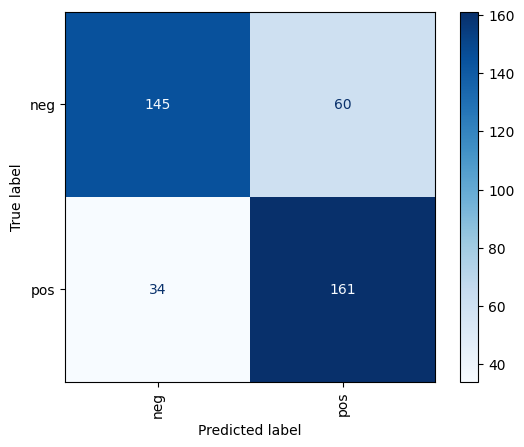

In [21]:
# Fit the pipeline on the training data and make predictions on the test data
pipeline.fit(docs_train, y_train)
y_predicted = pipeline.predict(docs_test)

# Print evaluation metrics
print('Evaluation metrics')
print('==================')
print(metrics.classification_report(y_test, y_predicted, target_names=dataset_target_names))

# Generate and display the confusion matrix
cm = metrics.confusion_matrix(y_true=y_test, y_pred=y_predicted, labels=dataset_target_names)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=dataset_target_names)
disp = disp.plot(include_values=True, cmap='Blues', ax=None, xticks_rotation='vertical')
plt.show()

# Extract feature log odds
vect = pipeline.steps[0][1]
clf = pipeline.steps[2][1]
logodds = clf.feature_log_prob_[1] - clf.feature_log_prob_[0]

# Create a lookup dictionary for feature names
lookup = dict((v, k) for k, v in vect.vocabulary_.items())


Now, let's examine the features ranked by their information gain (MI) and their association with each class. This code retrieves the feature scores, selects the top features, and displays them based on information gain (MI) and class association. You can adjust the sorting criteria as needed.

In [22]:
# Get SelectKBest feature scores
features = pipeline.named_steps['selector']
# Get the top k feature indices
cols = features.get_support(indices=True)
# Get the corresponding feature scores
top_k_feature_scores  = [features.scores_[i] for i in cols]

# Get the vectorizer
featnames = pipeline.named_steps['vectorizer']
# Get all feature names
fred = vect.get_feature_names_out()
# Get the corresponding feature names
top_k_feature_names = [fred[i] for i in cols]

# Create a DataFrame with feature names, scores, and log odds
names_scores = list(zip(top_k_feature_names, top_k_feature_scores, logodds))
ns_df = pd.DataFrame(data = names_scores, columns=['Feature_names', 'Feature_Scores', 'Log odds'])

# Sort the dataframe for better visualization - you can change this to reorder as needed
print('Top features by information gain')
ns_df_sorted = ns_df.sort_values(['Feature_Scores', 'Log odds', 'Feature_names'], ascending = [False, False, False])
display(ns_df_sorted[0:10])

print('Features most indicative of', dataset_target_names[0])
ns_df_sorted = ns_df.sort_values(['Log odds', 'Feature_Scores', 'Feature_names'], ascending = [True, False, False])
display(ns_df_sorted[0:10])

print('Features most indicative of', dataset_target_names[1])
ns_df_sorted = ns_df.sort_values(['Log odds', 'Feature_Scores', 'Feature_names'], ascending = [False, False, False])
display(ns_df_sorted[0:10])


Top features by information gain


,Feature_names,Feature_Scores,Log odds
9,bad,0.050300,-1.254624
98,worst,0.033198,-1.874970
81,stupid,0.027821,-1.736474
12,boring,0.026891,-1.842097
39,life,0.025971,0.571856
70,ridiculous,0.020400,-1.988796
59,perfect,0.019834,0.855585
83,supposed,0.018525,-1.321654
91,waste,0.018386,-1.825671
63,plot,0.018312,-0.683204


Features most indicative of neg


,Feature_names,Feature_Scores,Log odds
70,ridiculous,0.020400,-1.988796
98,worst,0.033198,-1.874970
12,boring,0.026891,-1.842097
91,waste,0.018386,-1.825671
81,stupid,0.027821,-1.736474
19,dull,0.013169,-1.670343
8,awful,0.015293,-1.661076
47,mess,0.014821,-1.533748
23,fails,0.010295,-1.429868
86,terrible,0.010532,-1.390647


Features most indicative of pos


,Feature_names,Feature_Scores,Log odds
14,cameron,0.008943,1.331792
82,subtle,0.012963,1.268613
22,excellent,0.014146,1.207919
64,political,0.007647,1.189570
60,perfectly,0.012789,1.115850
45,memorable,0.011247,1.102457
66,realistic,0.010772,1.101180
94,wonderful,0.014534,1.022286
84,sweet,0.006640,0.978313
36,jackie,0.006692,0.960140


## Displaying All Extracted Features

For your reference, here is a count and a comprehensive list of all the features that were extracted during the initial step of the pipeline.

In [23]:
print('Total Features: ',len(vect.get_feature_names_out()))
print(vect.get_feature_names_out())

Total Features:  1000
['ability' 'able' 'absolutely' 'across' 'act' 'acting' 'action' 'actor'
 'actors' 'actress' 'actual' 'actually' 'add' 'age' 'agent' 'ago' 'air'
 'alien' 'aliens' 'allen' 'almost' 'alone' 'along' 'already' 'also'
 'although' 'always' 'amazing' 'america' 'american' 'among' 'amount'
 'amusing' 'animated' 'animation' 'annoying' 'another' 'anyone' 'anything'
 'anyway' 'apparently' 'appear' 'appears' 'approach' 'army' 'around' 'art'
 'aside' 'ask' 'aspect' 'atmosphere' 'attempt' 'attempts' 'attention'
 'audience' 'audiences' 'away' 'awful' 'b' 'baby' 'back' 'background'
 'bad' 'band' 'based' 'basic' 'basically' 'batman' 'battle' 'beautiful'
 'become' 'becomes' 'begin' 'beginning' 'begins' 'behind' 'believable'
 'believe' 'ben' 'best' 'better' 'beyond' 'big' 'biggest' 'bill' 'billy'
 'bit' 'black' 'blood' 'bob' 'body' 'bond' 'book' 'boring' 'box' 'boy'
 'break' 'brief' 'brilliant' 'bring' 'brings' 'brother' 'brothers'
 'brought' 'bruce' 'budget' 'bunch' 'business' 'call'

This is a list of all features selected based on information gain.

In [24]:
print('Total Features: ',len(ns_df['Feature_names']))
print(list(ns_df['Feature_names']))

Total Features:  100
['action', 'aliens', 'also', 'although', 'always', 'america', 'american', 'attempt', 'awful', 'bad', 'beautiful', 'best', 'boring', 'brilliant', 'cameron', 'classic', 'dark', 'death', 'different', 'dull', 'effective', 'especially', 'excellent', 'fails', 'family', 'father', 'film', 'finds', 'first', 'friends', 'gives', 'giving', 'great', 'heart', 'highly', 'hilarious', 'jackie', 'jokes', 'least', 'life', 'like', 'looks', 'love', 'many', 'maybe', 'memorable', 'men', 'mess', 'minute', 'mother', 'movie', 'none', 'nothing', 'often', 'one', 'oscar', 'others', 'overall', 'people', 'perfect', 'perfectly', 'performance', 'performances', 'plot', 'political', 'quite', 'realistic', 'reality', 'reason', 'relationship', 'ridiculous', 'right', 'script', 'seen', 'shows', 'small', 'sometimes', 'song', 'star', 'still', 'story', 'stupid', 'subtle', 'supposed', 'sweet', 'takes', 'terrible', 'true', 'unfortunately', 'visual', 'war', 'waste', 'well', 'wife', 'wonderful', 'works', 'world

## Examine Documents Classified Correctly and Incorrectly

The word clouds displayed below exclusively incorporate the selected features utilized in the classification process.

neg Correctly classified


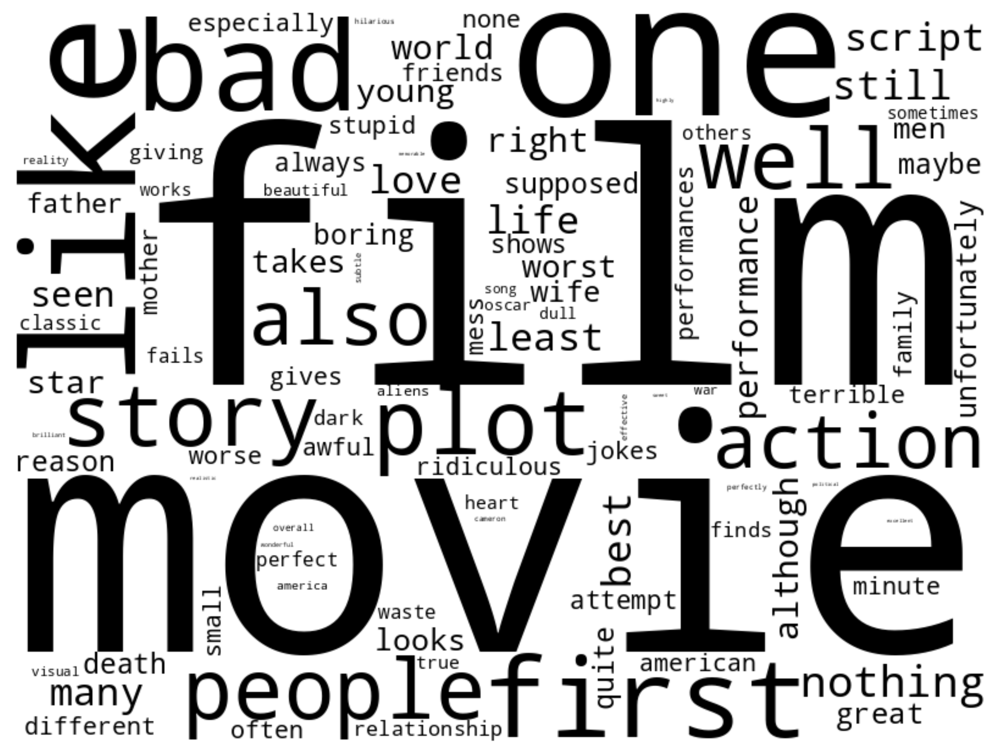

0	neg	plot : something about a bunch of kids going into a haunted house and playing ou...
5	neg	if you've been following william fichtner's career ( and there's absolutely no r...
8	neg	even the best comic actor is at the mercy of his or her material , as this subpa...
10	neg	joe versus the volcano is really one of the worse movies made in very recent mem...
12	neg	a movie about divorce and custody in 1995 seems about as timely as a movie about...
14	neg	it happens every year -- the days get longer , the weather gets warmer and the s...
16	neg	it's tough to be an aspiring superhero in champion city . just ask mr . furious...
18	neg	`the bachelor' is one of the best terrible movies you will ever see . wading th...
22	neg	synopsis : a humorless police officer's life changes when he befriends a super-s...
25	neg	if anything , " stigmata " should be taken as a warning against releasing simila...
27	neg	brian de palma's snake eyes stars nicolas cage's evil twin , who confusingly use...
30	n

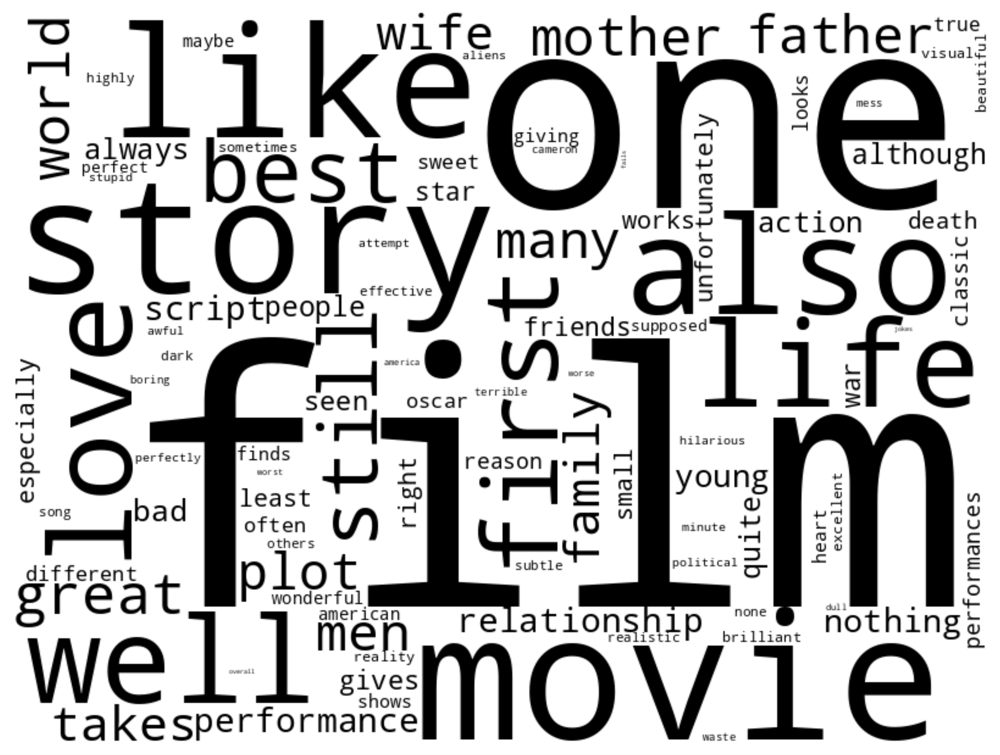

7	neg	in my review of " the spy who shagged me , " i postulated an unbreakable law of ...
13	neg	terrence malick made an excellent 90 minute film adaptation of james jones' worl...
19	neg	michael crichton has had a long career of writing novels , many of which are sci...
24	neg	the art of woo attempts to be one of those films like breakfast at tiffany's in ...
26	neg	this well-conceived but ultra sugary coming-of-age film is not for everyone , an...
29	neg	" an intimate , character-driven drama about a troubled youth at a crossroads i...
56	neg	remember tom cruise and brian brown as rival bartenders juggling bottles of booz...
67	neg	don't get me wrong -- i tend to appreciate besson's naive , unashamedly romantic...
80	neg	so , it's thirty years later , and oscar and felix are together again . that mi...
86	neg	two party guys bob their heads to haddaway's dance hit " what is love ? " while...
87	neg	except for a few bright moments of good verbal comedy , that old feeling is emba...
88	

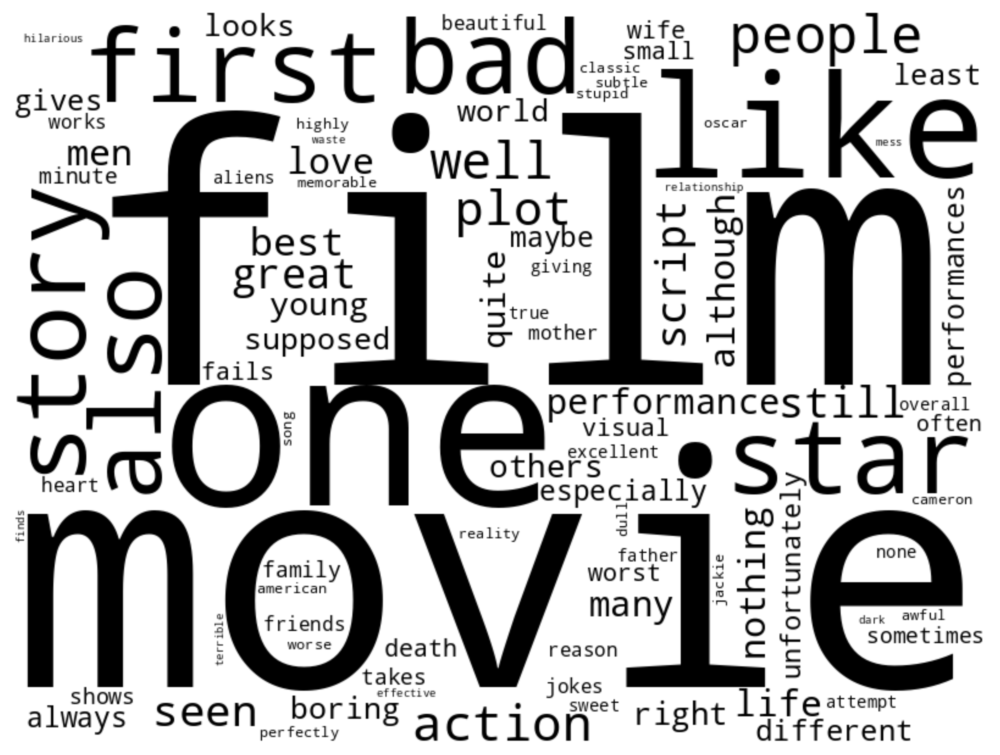

43	pos	let me open this one with a confession : i love cop movies . i adore them with ...
51	pos	deep rising is one of " those " movies . the kind of movie which serves no purp...
60	pos	voices . . . . . trey parker , matt stone , george clooney , minnie driver . "...
63	pos	swashbuckling adventure that can be enjoyed by both children and adults . steve...
77	pos	[note that followups are directed to rec . arts . movies . current-films and rec...
78	pos	of the major horror sub-genres , vampire movies are easily the most adaptable . ...
82	pos	apollo 13 is simply one of the most dramatic film this summer ( apart from swash...
89	pos	it's a curious thing - i've found that when willis is not called on to carry the...
92	pos	`strange days' chronicles the last two days of 1999 in los angeles . as the loc...
97	pos	i'm not really sure what to think about " crash . " on the surface , it's a col...
104	pos	in 1987 the stock market crashed , and oliver stone's wall street was released t...
107	p

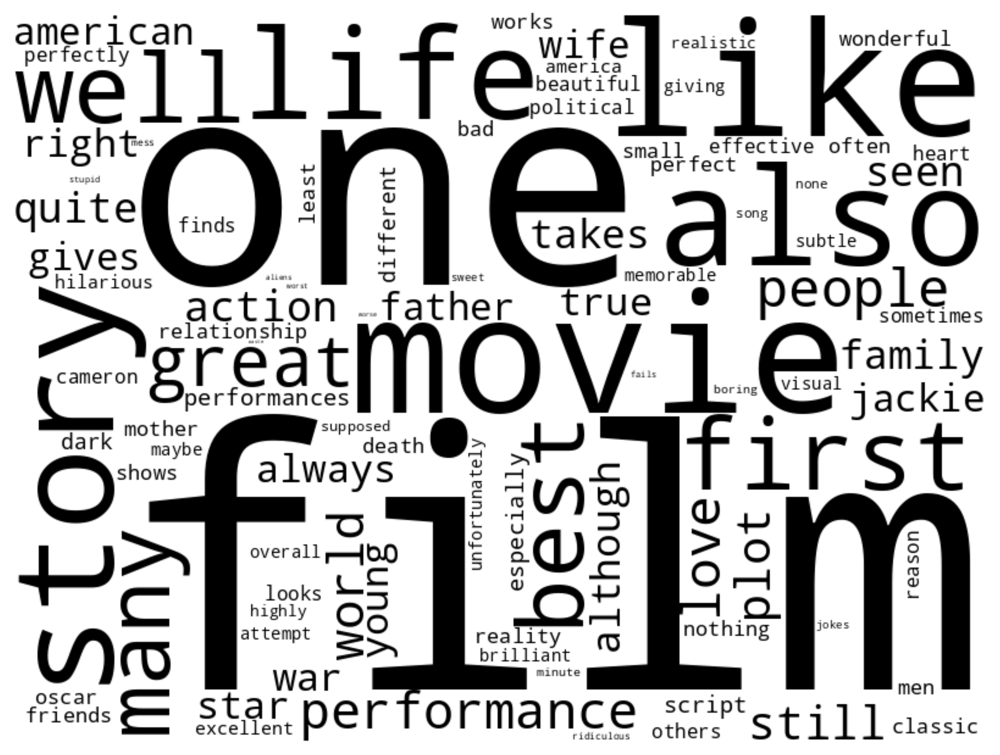

1	pos	there must be some unwritten rule that states , one gets enlightenment not in th...
2	pos	let's face it : the $100 million-plus smash that was " goldeneye " was not a goo...
3	pos	scream 2 isn't quite as clever as its predecessor , but it fills the gap with a ...
4	pos	there is a striking scene early in " city of angels , " where all the angels who...
6	pos	tone alone cannot sustain a film , but it can go a long way . if i can find mys...
9	pos	it was only a matter of time before a dilbert-esque office comedy hit the screen...
11	pos	note : some may consider portions of the following text to be spoilers . be for...
15	pos	( warning to those who have not seen seven : this review contains some spoiler ...
17	pos	synopsis : shrek ( myers ) is an ogre living in contented solitude deep in the h...
20	pos	with his last two films - shine and snow falling on cedars - australian director...
21	pos	imagine this . you're given a sword and a shield and very basic , minimal train...
23	pos	i 

In [25]:
# Set up counters for each cell in the confusion matrix
counter = {}
previews = {}
for true_target, target_name in enumerate(dataset_target_names):
    counter[target_name] = {}
    previews[target_name] = {}
    for predicted_target, ptarget_name in enumerate(dataset_target_names):
        counter[target_name][ptarget_name] = {}
        previews[target_name][ptarget_name] = ''

# Get the document-term matrix for test documents
doc_terms = vect.transform(docs_test)

# Iterate through all predictions, building the counter and preview of documents
# There is a more efficient way to do this, but this will suffice for now!
for doc_id, prediction in enumerate(pipeline.predict(docs_test)):
    for k, v in enumerate(doc_terms[doc_id].toarray()[0]):
        if v > 0 and lookup[k] in list(ns_df['Feature_names']):
            if lookup[k] not in counter[y_test[doc_id]][prediction]:
                counter[y_test[doc_id]][prediction][lookup[k]] = 0
            counter[y_test[doc_id]][prediction][lookup[k]] += v

    previews[y_test[doc_id]][prediction] += get_preview(docs_test, y_test, dataset_target_names, doc_id, max_len=80) + '\n'

# Output a word cloud and preview of documents for each cell of the confusion matrix
for true_target, target_name in enumerate(dataset_target_names):
    for predicted_target, ptarget_name in enumerate(dataset_target_names):
        if true_target == predicted_target:
            print(dataset_target_names[true_target], 'Correctly classified')
        else:
            print(dataset_target_names[true_target], 'incorrectly classified as', dataset_target_names[predicted_target])
        print('=================================================================')

        wordcloud = WordCloud(background_color="white", width=800, height=600, color_func=lambda *args, **kwargs: "black").generate_from_frequencies(counter[target_name][ptarget_name])
        plt.figure(figsize=(16, 8), dpi= 600)
        plt.imshow(wordcloud, interpolation="bilinear")
        plt.axis("off")
        plt.show()

        print(previews[target_name][ptarget_name])


## Preview a Document and Its Features

Feel free to utilise this cell to preview a specific document based on its index within the test set. Here, you will find information such as the predicted label, the actual label, the full text of the document, and the features associated with this particular document.

In [26]:
test_id = 82

print('Prediction')
print('==========')
print(pipeline.predict([docs_test[test_id]])[0])
print()

print(get_preview(docs_test, y_test, dataset_target_names, test_id))

print('Features')
print('========')
for k, v in enumerate(vect.transform([docs_test[test_id]]).toarray()[0]):
    if v > 0 and lookup[k] in list(ns_df['Feature_names']):
        print(v, '\t', lookup[k])

Prediction
neg

Label
=====
pos

Full Text
apollo 13 is simply one of the most dramatic film this summer ( apart from swashbuckling braveheart ) . 
director ( and former actor ) ron howard ( splash , backdraft , far & away ) , most noted for his dramatic film making , displays again his brilliance in creating drama and suspense in apollo 13 . 
being the second largest box office hit in the us this summer ( with more than us$150 million in the states alone ) , this film is his most successful effort yet . 
perhaps one of the most appealing feature of this film is the pool of talented actors such as tom hanks ( gump himself ) , kevin bacon ( footloose , tremors , a few good men etc . ) , gary sinise ( forrest gump ) , bill paxton ( aliens , true lies , boxing helena ) and ed harris ( the abyss , just cause ) . . 
all of whom gave good performances in their respective roles . 
apollo 13 was the second worst accident ever to occur in the history of us spaceflight ( the worst being the chal

## Automated Parameter Tuning

In the following section, we will delve into automated parameter tuning. Please be aware that this process may require a significant amount of time to complete.

### Define the Search Space

This initial step involves defining the space of parameters and estimators we intend to explore. We represent this space using a dictionary and utilize double underscore notation (__) to reference the parameters of different stages within our pipeline. In this context, we will experiment with various values of 'k' for the feature selector 'SelectKBest'. However, it's important to note that this is not an exhaustive list of parameters available for exploration. You also have the option to explore parameters for the feature extraction step, using either 'CountVectorizer' or 'TfidfVectorizer'. Some sample parameters are provided as comments, and you have the flexibility to test them, although this may require a considerable amount of time.

In [27]:
# Define a new pipeline for parameter tuning
pipeline2 = Pipeline([
    ('vectorizer', Vectorizer(tokenizer    = tokenise,
                              lowercase    = lowercase,
                              min_df       = min_df,
                              max_df       = max_df,
                              max_features = max_features,
                              stop_words   = stop_words,
                              ngram_range  = ngram_range,
                              encoding     = encoding,
                              preprocessor = preprocess_text,
                              decode_error = decode_error)),
    ('selector', SelectKBest()),
    ('classifier', MultinomialNB()), # Specify an alternative classifier here
])

# Define the search space as a list of dictionaries
search_space = [{'selector__k'              : range(50, 701, 50), # Starts at 50 and ends at 700 with steps of 50
                 'selector__score_func'     : [mutual_info_classif, chi2],
                 'vectorizer'               : [CountVectorizer(), TfidfVectorizer()],
                 'vectorizer__max_features' : [700, 2000]
                }]


The scorers can either be one of the predefined metric strings or a callable scorer, such as the one returned by `make_scorer`.



In [28]:
scoring = {'Accuracy': make_scorer(accuracy_score)}

## Perform the GridSearch

This is where the real magic unfolds. We will now feed our pipeline into GridSearchCV to explore our search space, which encompasses various combinations of feature preprocessing, feature selection, model selection, and hyperparameter tuning. We'll employ 3-fold cross-validation for this demonstration, but in practice, increasing the number of folds (cv) to 5 or 10 would be advisable if time permits.

By setting `refit='Accuracy'`, the best-performing estimator will be refitted on the entire dataset with the parameter configuration that achieved the highest cross-validated Accuracy score. You can access this estimator using ``clf2.best_estimator_``, along with additional information such as ``clf2.best_score_``, ``clf2.best_params_``, and ``clf2.best_index_``.

In [29]:
clf2 = GridSearchCV(estimator          = pipeline2,
                    param_grid         = search_space,
                    scoring            = scoring,
                    cv                 = 3,
                    refit              = 'Accuracy',
                    return_train_score = True,
                    verbose            = 1)
clf2 = clf2.fit(docs_train, y_train)

Fitting 3 folds for each of 112 candidates, totalling 336 fits


### Retrieve the Results

We can retrieve the best result from our search using the `best_estimator_` attribute.

In [30]:
clf2.best_estimator_

Pipeline(steps=[('vectorizer', CountVectorizer(max_features=2000)),
                ('selector',
                 SelectKBest(k=550,
                             score_func=<function chi2 at 0x7c7cb85e4b80>)),
                ('classifier', MultinomialNB())])

In [31]:
clf2.best_score_

0.8156291502413727

### Extracting Information from the cv_results_ Dictionary

Here, we will illustrate various techniques for extracting information from the `cv_results_` dictionary.

In [32]:
# Extract mean and standard deviation of test Accuracy scores and print them along with corresponding parameters
means = clf2.cv_results_['mean_test_Accuracy']
stds  = clf2.cv_results_['std_test_Accuracy']

for mean, std, params in zip(means, stds, clf2.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std * 2, params))


0.729 (+/-0.034) for {'selector__k': 50, 'selector__score_func': <function mutual_info_classif at 0x7c7cb8428160>, 'vectorizer': CountVectorizer(max_features=2000), 'vectorizer__max_features': 700}
0.762 (+/-0.049) for {'selector__k': 50, 'selector__score_func': <function mutual_info_classif at 0x7c7cb8428160>, 'vectorizer': CountVectorizer(max_features=2000), 'vectorizer__max_features': 2000}
0.637 (+/-0.018) for {'selector__k': 50, 'selector__score_func': <function mutual_info_classif at 0x7c7cb8428160>, 'vectorizer': TfidfVectorizer(), 'vectorizer__max_features': 700}
0.622 (+/-0.022) for {'selector__k': 50, 'selector__score_func': <function mutual_info_classif at 0x7c7cb8428160>, 'vectorizer': TfidfVectorizer(), 'vectorizer__max_features': 2000}
0.736 (+/-0.052) for {'selector__k': 50, 'selector__score_func': <function chi2 at 0x7c7cb85e4b80>, 'vectorizer': CountVectorizer(max_features=2000), 'vectorizer__max_features': 700}
0.744 (+/-0.038) for {'selector__k': 50, 'selector__score

In [33]:
# Calculate and print a classification report
from sklearn.metrics import classification_report
y_true, y_pred = y_test, clf2.best_estimator_.predict(docs_test)
print(classification_report(y_true, y_pred))

              precision    recall  f1-score   support

         neg       0.82      0.79      0.81       205
         pos       0.79      0.82      0.80       195

    accuracy                           0.81       400
   macro avg       0.81      0.81      0.80       400
weighted avg       0.81      0.81      0.81       400



## Visualise the Results

The following code for visualisation is sourced from https://scikit-learn.org/stable/auto_examples/model_selection/plot_multi_metric_evaluation.html.

Please take note that the range of the x and y axes is predefined below. Depending on the specific values you've chosen earlier, you may need to modify these ranges accordingly.

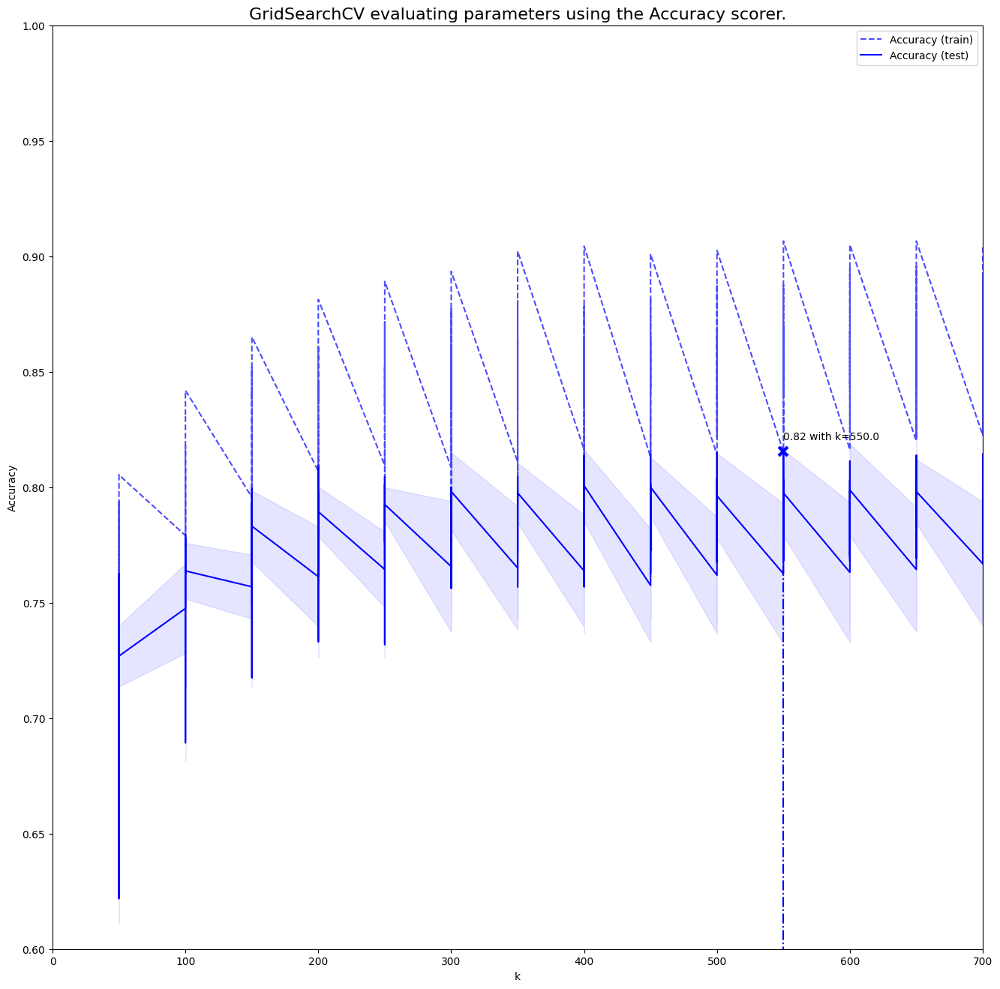

In [34]:
# Retrieve our results
results = clf2.cv_results_

plt.figure(figsize=(16, 16))
plt.title("GridSearchCV evaluating parameters using the Accuracy scorer.",
          fontsize=16)

plt.xlabel("k")
plt.ylabel("Accuracy")

ax = plt.gca()

# Adjust these values according to your accuracy results and range values.
ax.set_xlim(0, 700)
ax.set_ylim(0.60, 1)

# Get the regular numpy array from the MaskedArray
X_axis = np.array(results['param_selector__k'].data, dtype=float)

for scorer, color in zip(sorted(scoring), ['b']):
    for sample, style in (('train', '--'), ('test', '-')):
        sample_score_mean = results['mean_%s_%s' % (sample, scorer)]
        sample_score_std = results['std_%s_%s' % (sample, scorer)]
        ax.fill_between(X_axis, sample_score_mean - sample_score_std,
                        sample_score_mean + sample_score_std,
                        alpha=0.1 if sample == 'test' else 0, color=color)
        ax.plot(X_axis, sample_score_mean, style, color=color,
                alpha=1 if sample == 'test' else 0.7,
                label="%s (%s)" % (scorer, sample))

    best_index = np.nonzero(results['rank_test_%s' % scorer] == 1)[0][0]
    best_score = results['mean_test_%s' % scorer][best_index]

    # Plot a dotted vertical line at the best score for that scorer marked by x
    ax.plot([X_axis[best_index], ] * 2, [0, best_score],
            linestyle='-.', color=color, marker='x', markeredgewidth=3, ms=8)

    # Annotate the best score for that scorer
    ax.annotate("%0.2f with k=%s" % (best_score, X_axis[best_index]),
                (X_axis[best_index], best_score + 0.005))

plt.legend(loc="best")
plt.grid(False)
plt.show()
